In [1]:
import numpy as np
import os
import cv2
import h5py
import struct
import vtk
import vtk.util
from vtk.util import numpy_support
import matplotlib.pyplot as plt
from volume_extraction import *
from utilities import *
from VTKFunctions import *
from scipy.ndimage import affine_transform, rotate, zoom, shift
#from tqdm import tqdm
#from joblib import Parallel, delayed

from ipywidgets import FloatProgress
from IPython.display import display

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\cntk\cntk_py_init.py:84: UserWarning: 

################################################ Missing optional dependency (GPU-Specific) ################################################
   CNTK may crash if the component that depends on those dependencies is loaded.
   Visit https://docs.microsoft.com/en-us/cognitive-toolkit/Setup-Windows-Python#optional-gpu-specific-packages for more information.
############################################################################################################################################
If you intend to use CNTK without GPU support, you can ignore the (likely) GPU-specific warning!
############################################################################################################################################

  warnings.warn(WARNING_MSG_GPU_ONLY % ('GPU-Specific', 'https://docs.microsoft.com/en-us/cognitive-toolkit/Setup-Windows-Python#optional-gpu-specific-pack

In [ ]:
def CalculateBatch(impath, savepath, size, threshold = 80, mask = False, modelpath = None):
    # List directories
    files = os.listdir(impath)
    files.sort()
    print('Sample list')
    for i in range(len(files)):
        num = (i - 1) / 2
        if abs(num - np.floor(num)) != 0:
           num = '-'
            
        print('{0}\tname: {1}'.format(num, files[i]))
    print('Found {0} folders from given path.'.format(len(files)))
    
    while True:
        try:
            offset = int(input('Please give starting sample number.'))
            break
        except:
            print('Invalid input!')

    for k in range(1 + offset * 2, len(files), 2): # Skip 1 CA4+ file and 2 .zip files
        print(files[k])
        # Data path
        try:
            file = os.listdir(impath + "\\" + files[k] + "\\" + "Registration" )
            pth = impath + "\\" + files[k] + "\\" + "Registration"
        except FileNotFoundError: # Case: sample name folder twice
            try:
                file = os.listdir(impath + "\\" + files[k] + "\\" + files[k] + "\\" + "Registration" )
                pth = impath + "\\" + files[k] + "\\" + files[k] + "\\" + "Registration"
                print(pth)
            except FileNotFoundError: # Case: Unusable folder
                continue
        # Saved mask
        if mask:
            try:
                file = os.listdir(impath + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask" )
                maskpath = impath + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask"
            except FileNotFoundError: # Case: sample name folder twice
                try:
                    file = os.listdir(impath + "\\" + files[k - 2] + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask" )
                    maskpath = impath + "\\" + files[k - 2] + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask"
                except FileNotFoundError: # Case: Unusable folder
                    continue
            # Leave maskpath empty, since mask is segmented from samples
            print(pth)
            print(maskpath)
            # Pipeline with loaded mask
            Pipeline(pth, files[k], savepath, threshold, size, maskpath, None)
        # CNTK Model
        elif modelpath != None:
            # Pipeline with CNTK model
            Pipeline(pth, files[k], savepath, threshold, size, None, modelpath)
        else:
            raise Exception('Select mask or model to be used!')
            
def CalculateIndividual(impath, savepath, size, threshold = 80, mask = False, modelpath = None):
    # List directories
    files = os.listdir(impath)
    files.sort()
    
    print('Sample list')
    for i in range(len(files)):
        num = (i - 1) / 2
        if abs(num - np.floor(num)) != 0:
           num = '-'
        print('{0}\tname: {1}'.format(num, files[i]))
    print('Found {0} folders from given path.'.format(len(files)))
    while True:
        try:
            offset = int(input('Please input file number to be calculated.'))
            break
        except:
            print('Invalid input!')

    k = offset * 2 + 1
    print(files[k])
    # Data path
    try:
        file = os.listdir(impath + "\\" + files[k] + "\\" + "Registration" )
        pth = impath + "\\" + files[k] + "\\" + "Registration"
    except FileNotFoundError: # Case: sample name folder twice
        try:
            file = os.listdir(impath + "\\" + files[k] + "\\" + files[k] + "\\" + "Registration" )
            pth = impath + "\\" + files[k] + "\\" + files[k] + "\\" + "Registration"
            print(pth)
        except FileNotFoundError: # Case: Unusable folder
            raise Exception('File not found')
    # Saved mask
    if mask:
        try:
            file = os.listdir(impath + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask" )
            maskpath = impath + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask"
        except FileNotFoundError: # Case: sample name folder twice
            try:
                file = os.listdir(impath + "\\" + files[k - 2] + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask" )
                maskpath = impath + "\\" + files[k - 2] + "\\" + files[k - 2] + "\\Suoristettu\\Registration\\bone_mask"
            except FileNotFoundError: # Case: Unusable folder
                raise Exception('File not found')
        # Leave maskpath empty, since mask is segmented from samples
        print(pth)
        print(maskpath)
        # Pipeline with loaded mask
        Pipeline(pth, files[k], savepath, threshold, size, maskpath, None)
    # CNTK Model
    elif modelpath != None:
        # Pipeline with CNTK model
        Pipeline(pth, files[k], savepath, threshold, size, None, modelpath)
    else:
        raise Exception('Select mask or model to be used!')

### Full pipeline for all samples

Sample list
-	name: 13_R3L_2_CA4+_Rec
0.0	name: 13_R3L_2_PTA_48h_Rec
-	name: 13_R6TL_2_CA4+_Rec
1.0	name: 13_R6TL_2_PTA_48h_Rec
-	name: 14_R3L_2_CA4+_Rec
2.0	name: 14_R3L_2_PTA_48h_Rec
-	name: 14_R6LT_2_CA4+_Rec
3.0	name: 14_R6LT_2_PTA_48h_Rec
-	name: 15_L3L_2_CA4+_Rec
4.0	name: 15_L3L_2_PTA_48h_Rec
-	name: 15_L6TL_2_CA4+_Rec
5.0	name: 15_L6TL_2_PTA_48h_Rec
-	name: 20_R2M_2_CA4+_Rec
6.0	name: 20_R2M_2_PTA_48h_Rec
-	name: 20_R6TM_2_CA4+_Rec
7.0	name: 20_R6TM_2_PTA_48h_Rec
-	name: 21_L3L_2_CA4+_Rec
8.0	name: 21_L3L_2_PTA_48h_Rec
-	name: 21_L6LT_1_CA4+_Rec
9.0	name: 21_L6LT_1_PTA_48h_Rec
-	name: 22_L3L_2_CA4+_Rec
10.0	name: 22_L3L_2_PTA_48h_Rec
-	name: 22_L6TL_2_CA4+_Rec
11.0	name: 22_L6TL_2_PTA_48h_Rec
-	name: 23_R3L_2_CA4+_Rec
12.0	name: 23_R3L_2_PTA_48h_Rec
-	name: 23_R6LT_2_CA4+_Rec
13.0	name: 23_R6LT_2_PTA_48h_Rec
-	name: 24_R3L_2_CA4+_Rec
14.0	name: 24_R3L_2_PTA_48h_Rec
-	name: 24_R6LT_2_CA4+_Rec
15.0	name: 24_R6LT_2_PTA_48h_Rec
-	name: 25_L3L_1_CA4+_Rec
16.0	name: 25_L3L_1_PTA_48h_

FloatProgress(value=0.0, description='Loading:', max=1293.0)

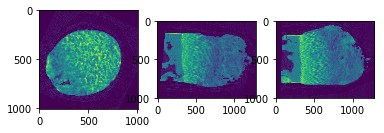

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

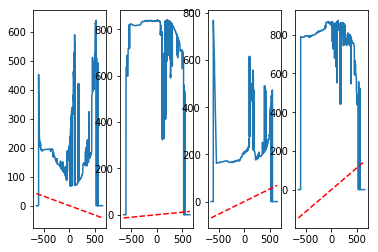

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


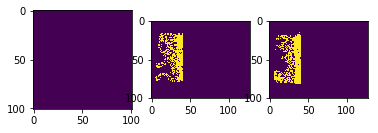

BBox angles: [-1.24664164], [ 9.42995358]
PCA angles: [[ 4.35381036]], [[ 4.87539624]]
Gradient descent angles: -4.0, -8.0
Gradient descent selected.


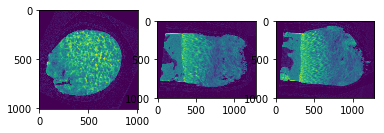

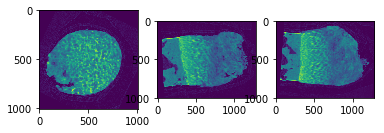

3. Crop and flip center volume:


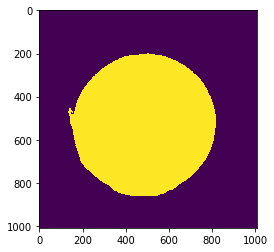

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


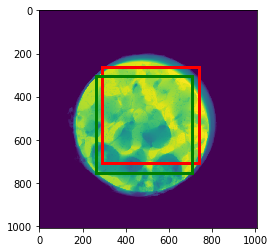

Center moment (green): x = 484, y = 530
Center of mass (red): x = 516.0, y = 485.0


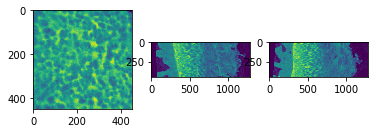

(448, 448, 1282)


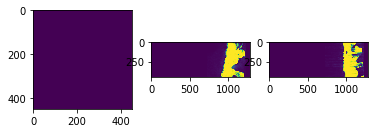

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

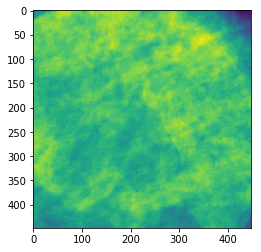

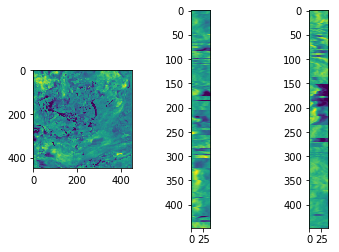

FloatProgress(value=0.0, description='Get interface:', max=448.0)

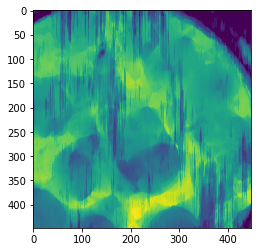

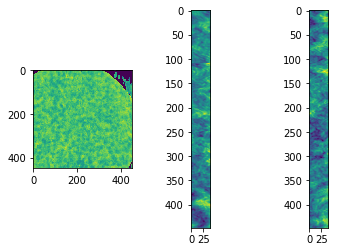

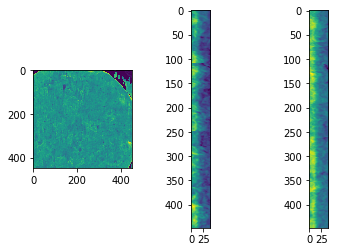

5. Save mean and std images


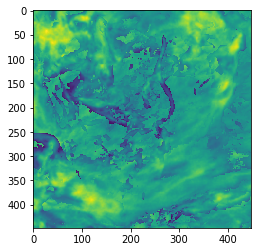

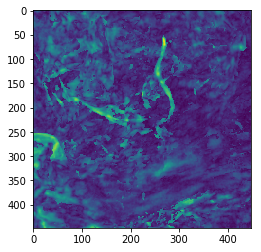

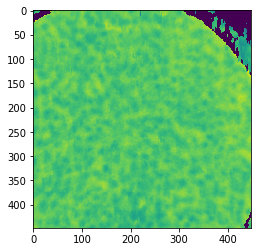

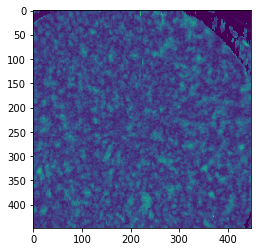

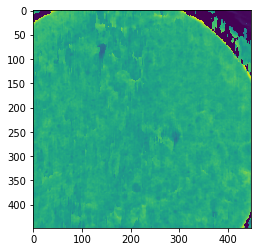

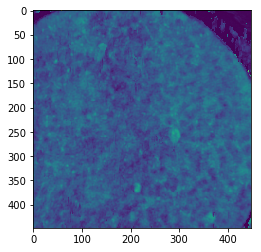

13_R6TL_2_PTA_48h_Rec
Sample name: 13_R6TL_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1265.0)

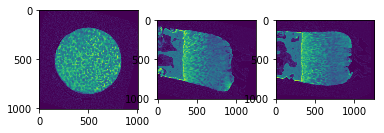

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

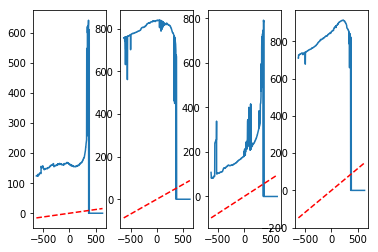

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


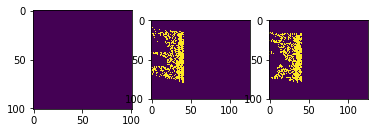

BBox angles: [ 4.64799023], [ 10.90592575]
PCA angles: [[-1.69233196]], [[-31.44804408]]
Gradient descent angles: 7.0, -6.0
Gradient descent selected.


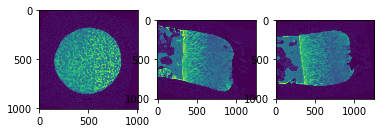

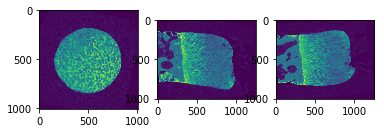

3. Crop and flip center volume:


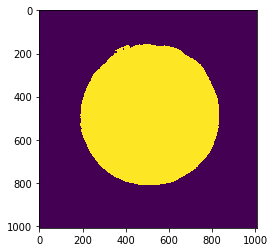

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


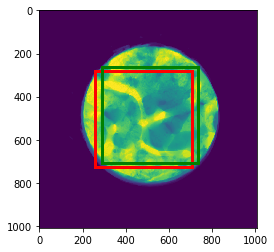

Center moment (green): x = 512, y = 484
Center of mass (red): x = 482.0, y = 503.0


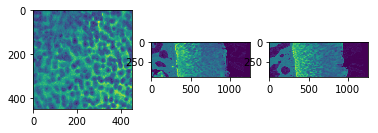

(448, 448, 1255)


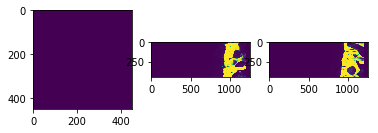

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

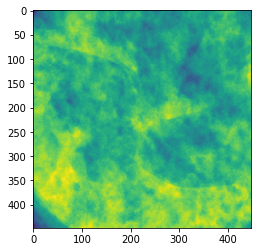

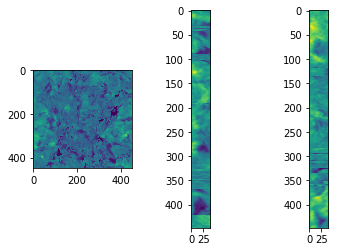

FloatProgress(value=0.0, description='Get interface:', max=448.0)

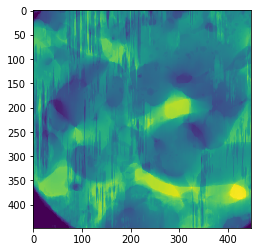

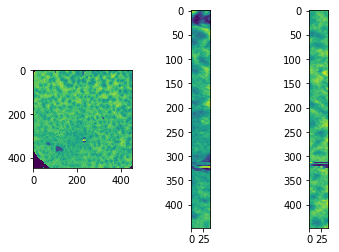

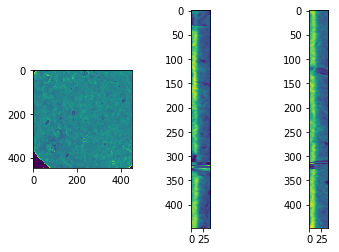

5. Save mean and std images


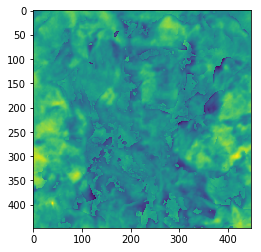

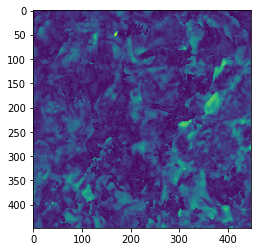

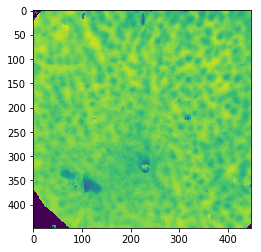

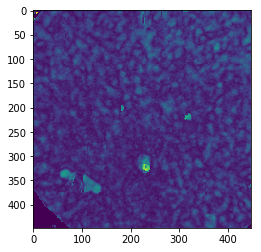

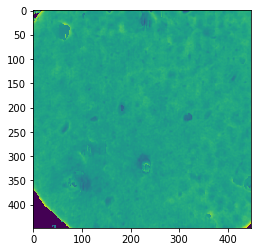

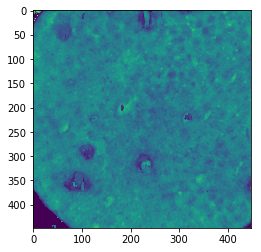

14_R3L_2_PTA_48h_Rec
Sample name: 14_R3L_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1264.0)

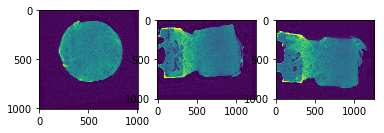

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

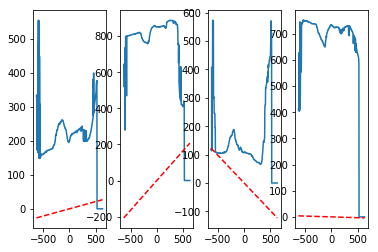

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


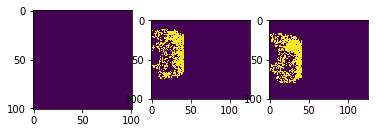

BBox angles: [ 10.29175949], [-5.67563581]
PCA angles: [[-6.87097577]], [[-0.57414512]]
Gradient descent angles: 3.0, 20.0
Gradient descent selected.


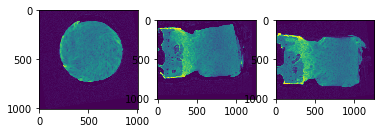

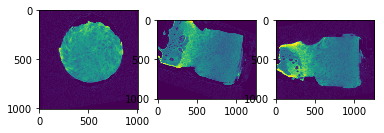

3. Crop and flip center volume:


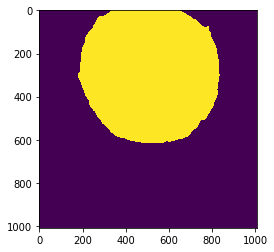

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


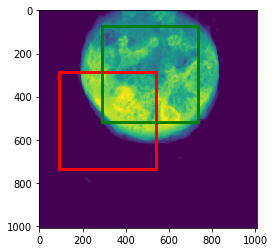

Center moment (green): x = 512, y = 295
Center of mass (red): x = 316.0, y = 509.0


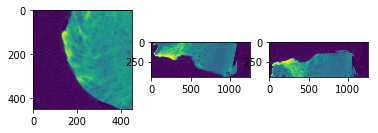

(448, 448, 1255)


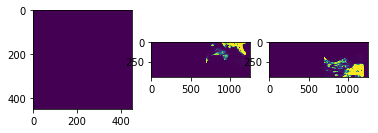

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

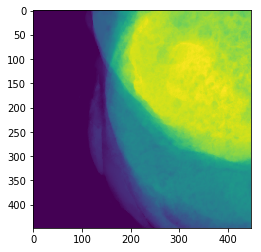

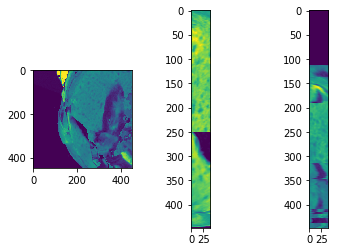

FloatProgress(value=0.0, description='Get interface:', max=448.0)

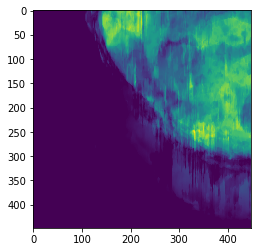

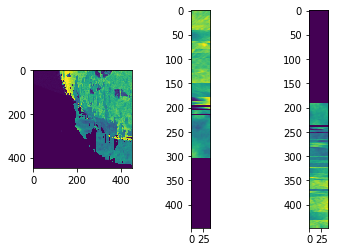

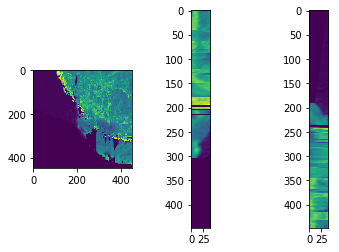

5. Save mean and std images


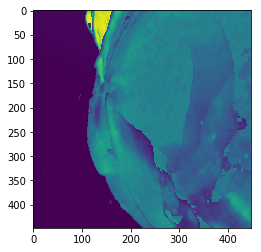

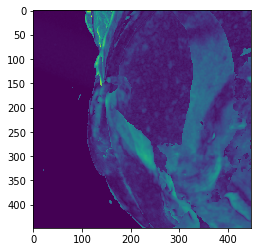

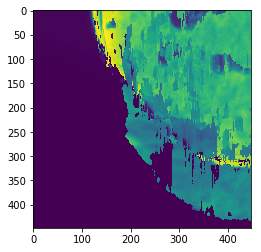

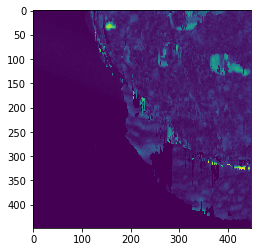

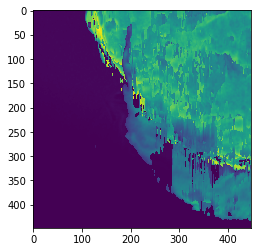

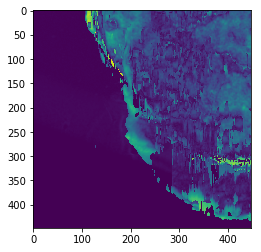

14_R6LT_2_PTA_48h_Rec
Sample name: 14_R6LT_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1271.0)

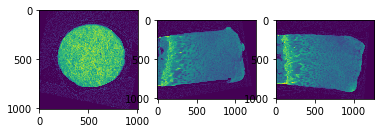

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

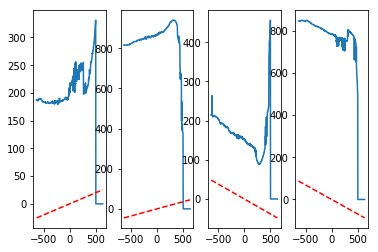

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


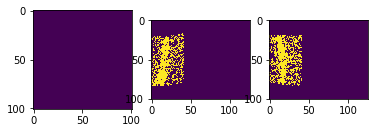

BBox angles: [ 3.16861725], [-6.0843401]
PCA angles: [[ 9.18918613]], [[ 10.38349568]]
Gradient descent angles: -1.0, 7.0
Gradient descent selected.


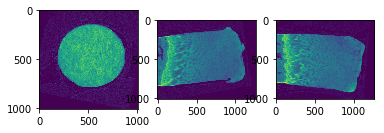

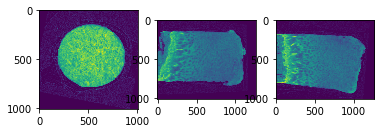

3. Crop and flip center volume:


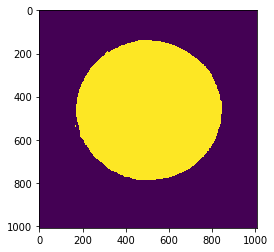

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


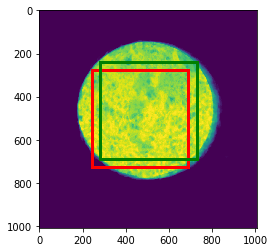

Center moment (green): x = 507, y = 463
Center of mass (red): x = 467.0, y = 500.0


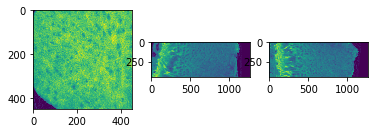

(448, 448, 1263)


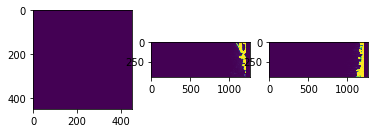

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

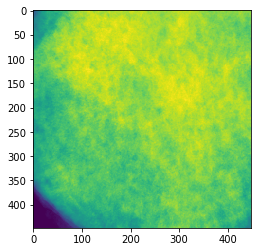

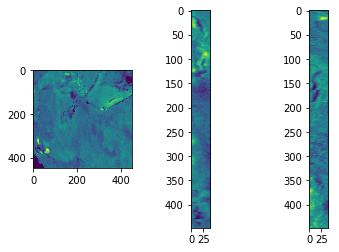

FloatProgress(value=0.0, description='Get interface:', max=448.0)

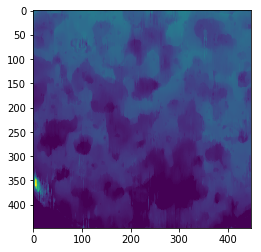

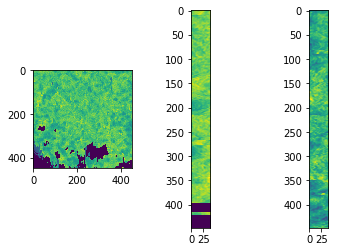

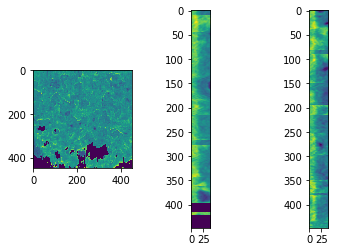

5. Save mean and std images


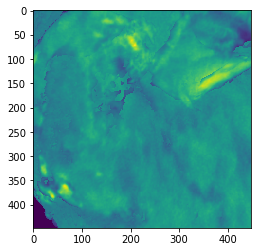

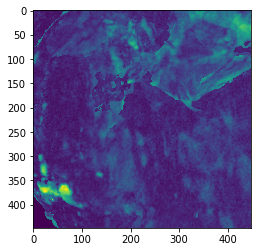

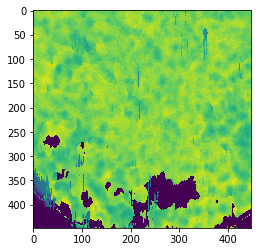

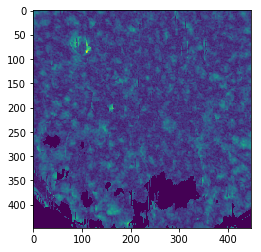

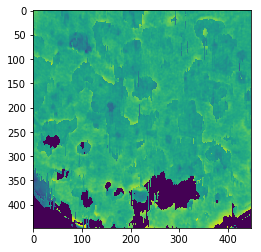

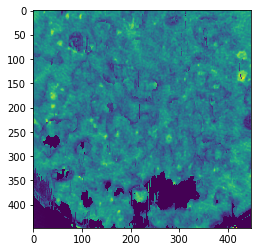

15_L3L_2_PTA_48h_Rec
Sample name: 15_L3L_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1284.0)

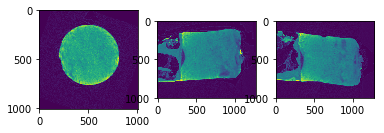

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

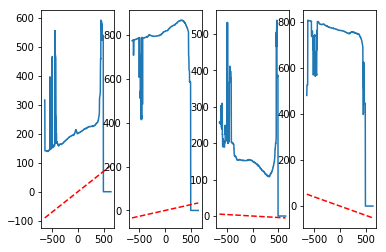

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


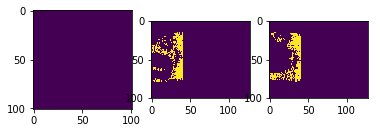

BBox angles: [ 5.5222559], [-2.52764058]
PCA angles: [[-7.601496]], [[-8.13266013]]
Gradient descent angles: 1.0, -2.0
Gradient descent selected.


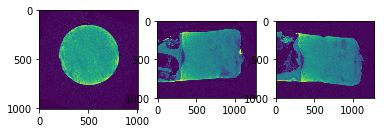

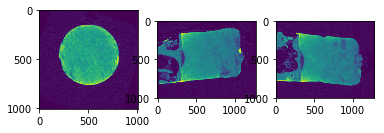

3. Crop and flip center volume:


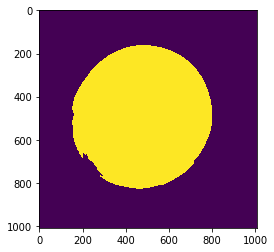

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


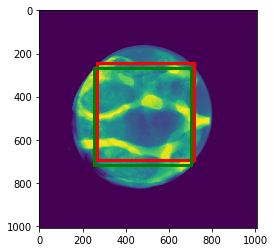

Center moment (green): x = 477, y = 492
Center of mass (red): x = 493.0, y = 469.0


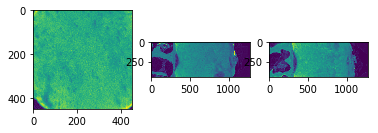

(448, 448, 1275)


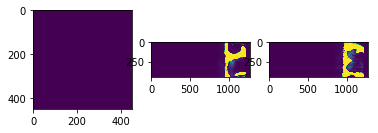

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

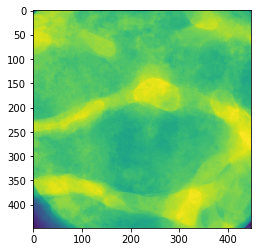

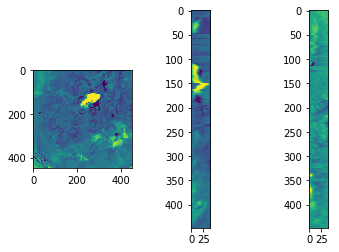

FloatProgress(value=0.0, description='Get interface:', max=448.0)

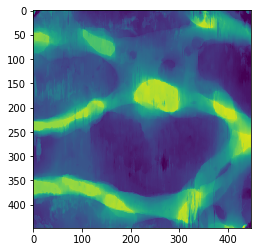

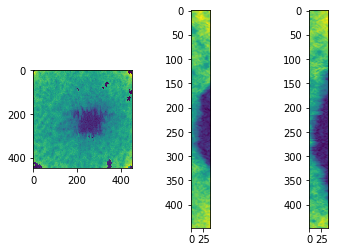

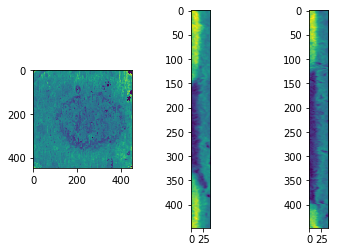

5. Save mean and std images


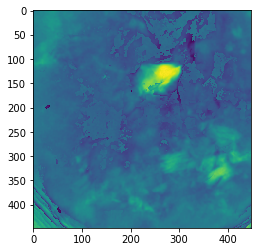

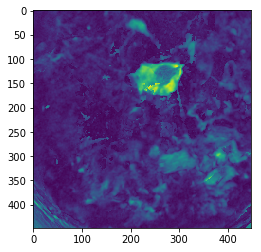

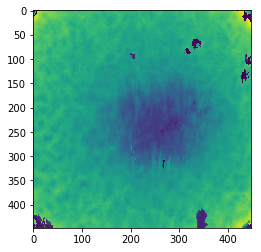

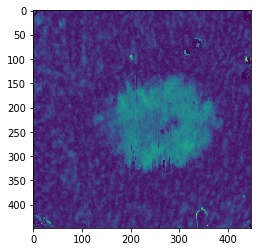

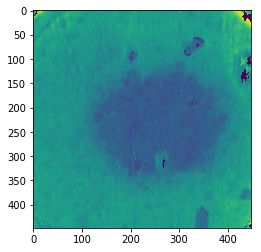

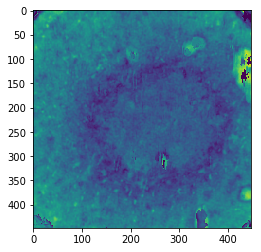

15_L6TL_2_PTA_48h_Rec
Sample name: 15_L6TL_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1266.0)

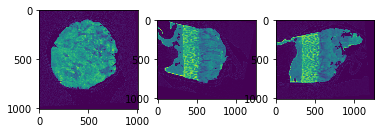

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

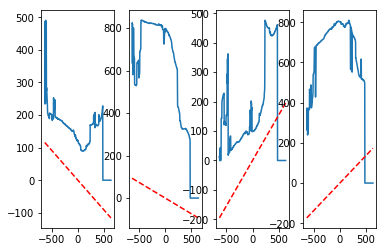

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


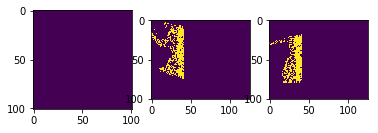

BBox angles: [-9.38181496], [ 16.21751022]
PCA angles: [[ 32.62925901]], [[-37.57015261]]
Gradient descent angles: -7.0, 15.0
Gradient descent selected.


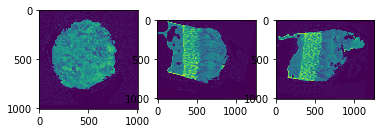

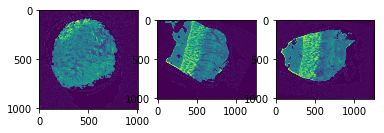

3. Crop and flip center volume:


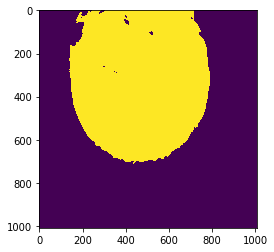

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


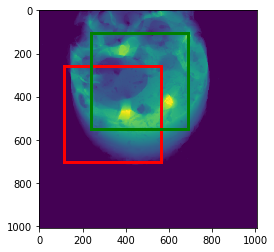

Center moment (green): x = 464, y = 327
Center of mass (red): x = 340.0, y = 480.0


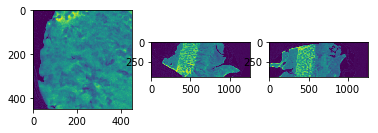

(448, 448, 1258)


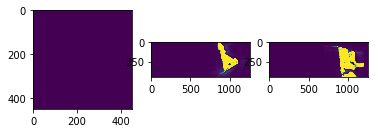

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

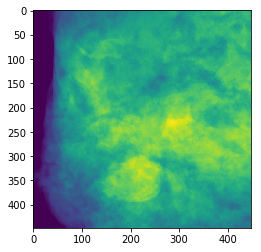

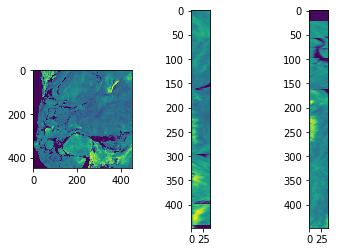

FloatProgress(value=0.0, description='Get interface:', max=448.0)

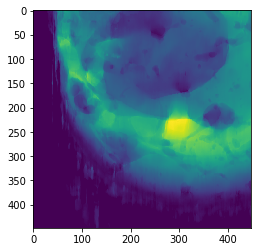

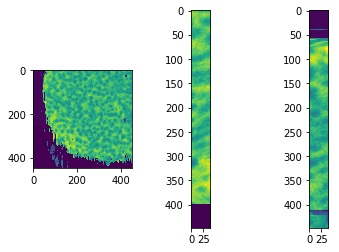

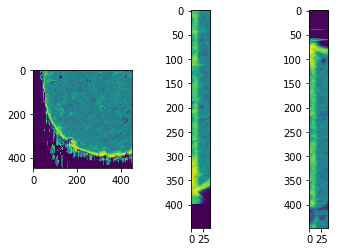

5. Save mean and std images


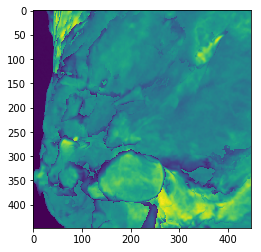

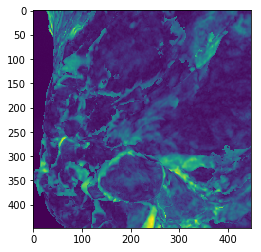

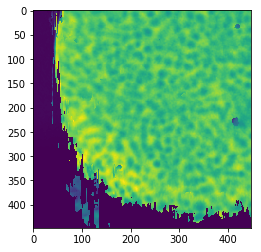

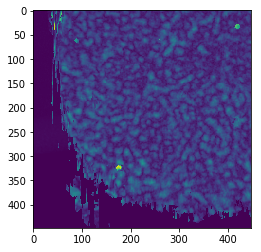

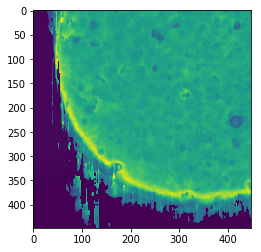

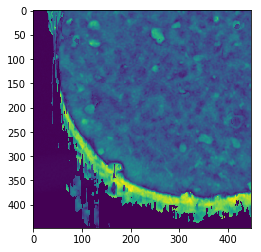

20_R2M_2_PTA_48h_Rec
Sample name: 20_R2M_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1188.0)

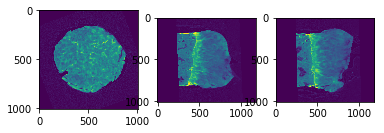

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

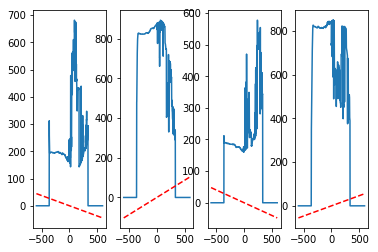

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


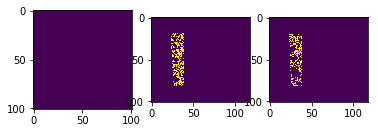

BBox angles: [ 2.77872801], [ 0.35126567]
PCA angles: [[ 86.37387486]], [[-84.35463069]]
Gradient descent angles: -2.0, -2.0
Gradient descent selected.


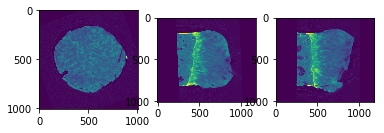

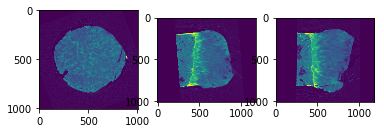

3. Crop and flip center volume:


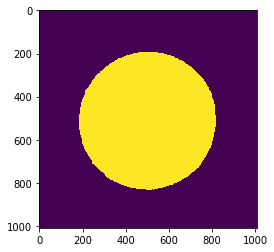

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


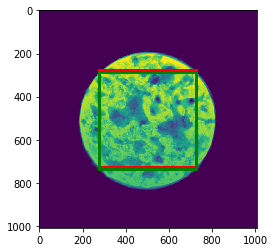

Center moment (green): x = 501, y = 511
Center of mass (red): x = 500.0, y = 501.0


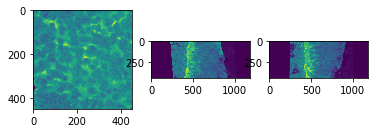

(448, 448, 1180)


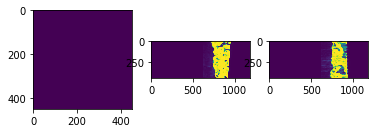

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

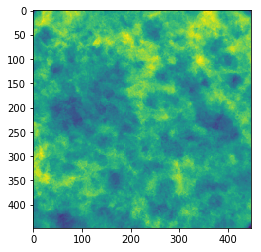

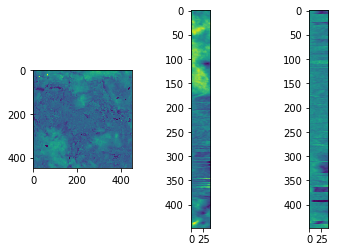

FloatProgress(value=0.0, description='Get interface:', max=448.0)

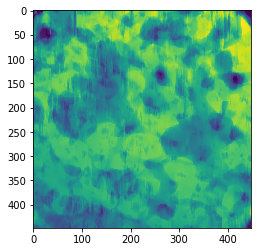

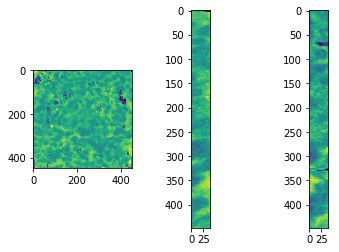

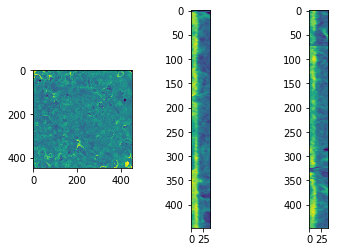

5. Save mean and std images


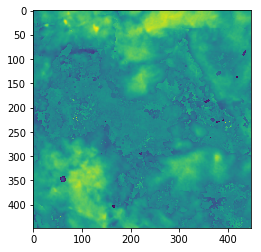

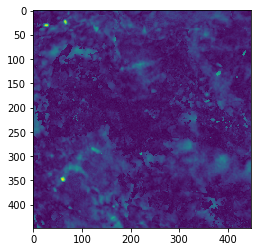

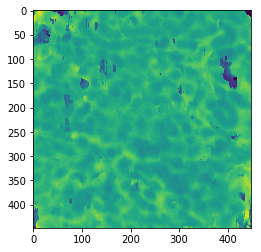

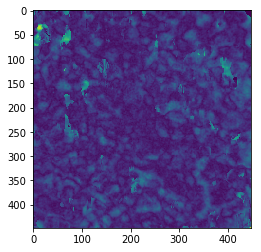

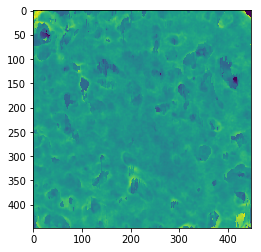

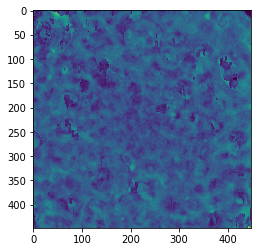

20_R6TM_2_PTA_48h_Rec
Sample name: 20_R6TM_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1343.0)

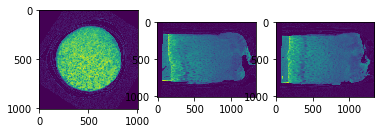

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

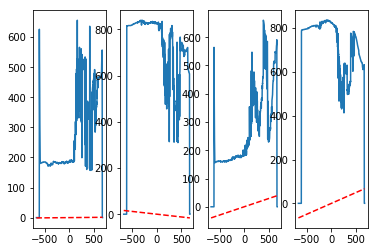

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


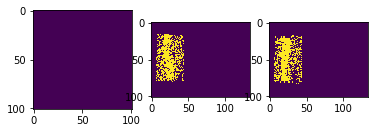

BBox angles: [-0.64325351], [ 4.51058626]
PCA angles: [[ 2.21828131]], [[ 4.11194858]]
Gradient descent angles: -1.0, -1.0
Gradient descent selected.


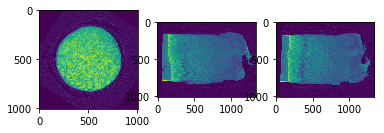

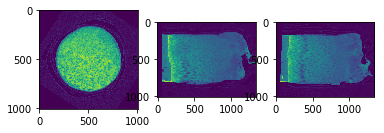

3. Crop and flip center volume:


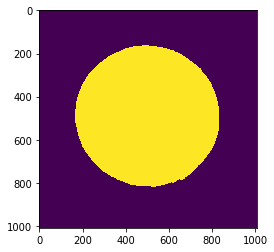

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


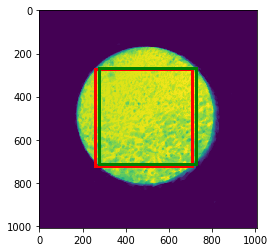

Center moment (green): x = 500, y = 490
Center of mass (red): x = 483.0, y = 495.0


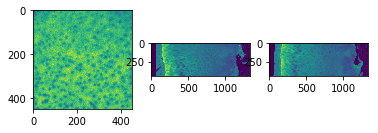

(448, 448, 1335)


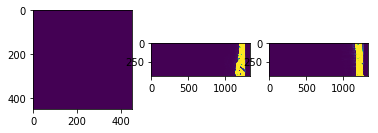

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

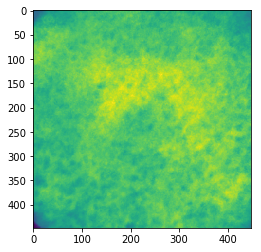

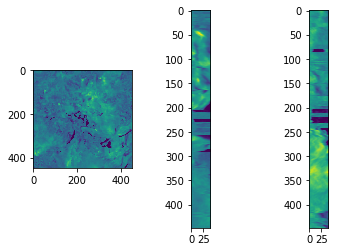

FloatProgress(value=0.0, description='Get interface:', max=448.0)

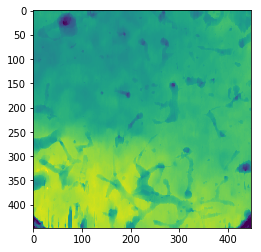

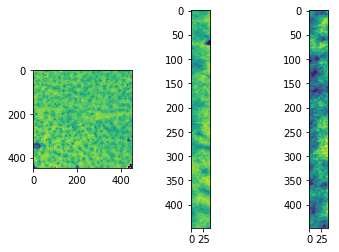

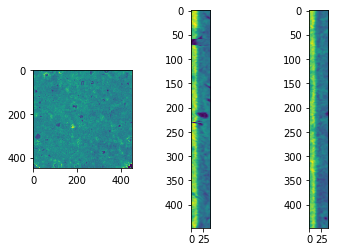

5. Save mean and std images


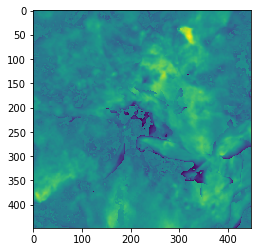

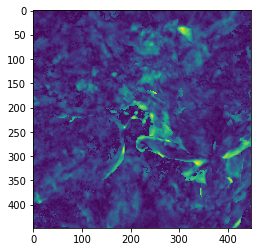

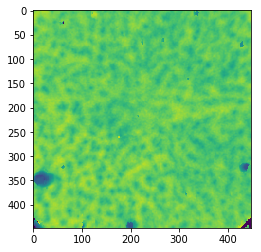

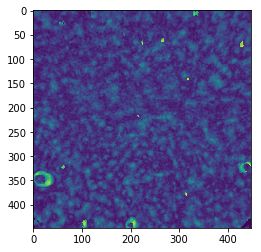

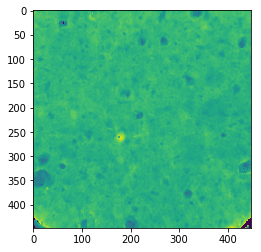

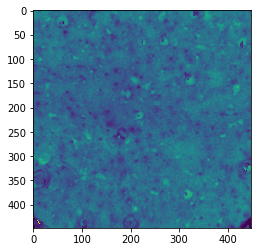

21_L3L_2_PTA_48h_Rec
Z:\3DHistoData\rekisteroidyt\21_L3L_2_PTA_48h_Rec\21_L3L_2_PTA_48h_Rec\Registration
Sample name: 21_L3L_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1119.0)

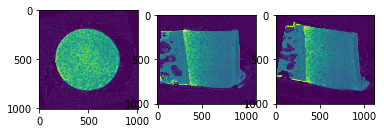

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

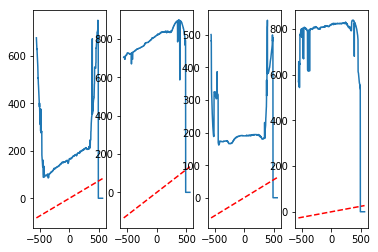

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


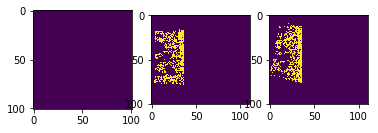

BBox angles: [ 10.92225838], [ 4.5425787]
PCA angles: [[ 22.83575965]], [[-7.23332942]]
Gradient descent angles: 4.0, -2.0
Gradient descent selected.


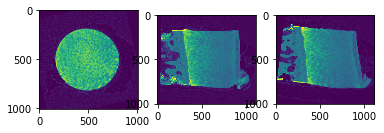

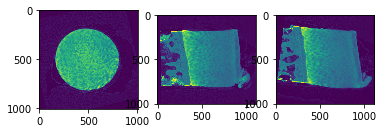

3. Crop and flip center volume:


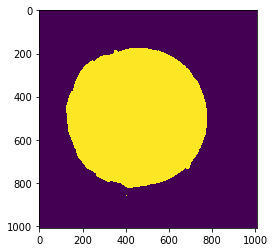

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


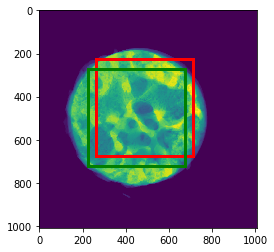

Center moment (green): x = 451, y = 495
Center of mass (red): x = 488.0, y = 451.0


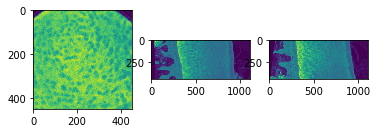

(448, 448, 1111)


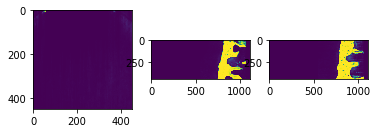

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

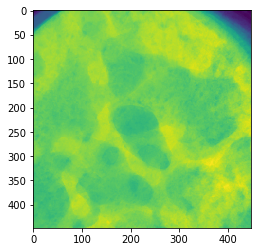

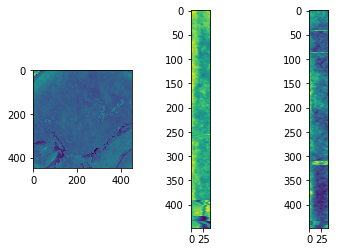

FloatProgress(value=0.0, description='Get interface:', max=448.0)

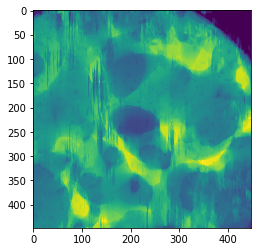

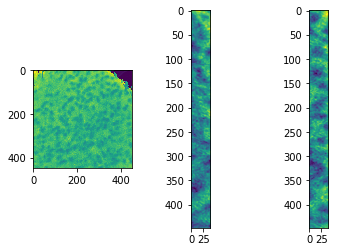

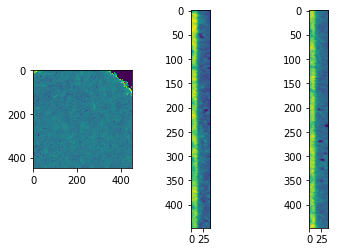

5. Save mean and std images


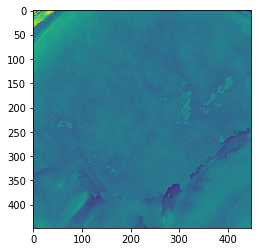

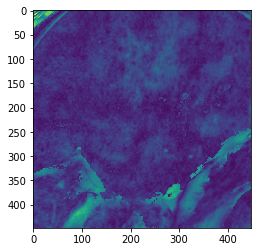

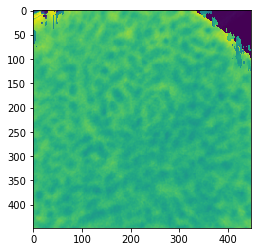

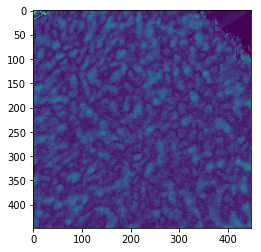

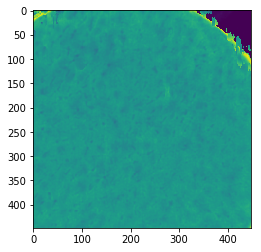

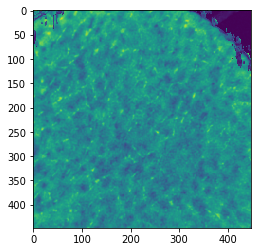

21_L6LT_1_PTA_48h_Rec
Z:\3DHistoData\rekisteroidyt\21_L6LT_1_PTA_48h_Rec\21_L6LT_1_PTA_48h_Rec\Registration
Sample name: 21_L6LT_1_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1158.0)

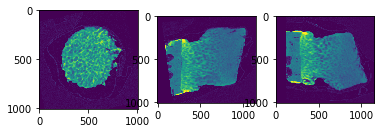

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

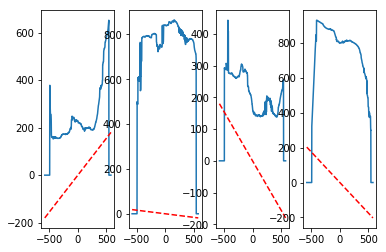

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


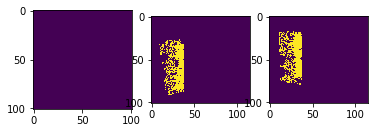

BBox angles: [ 7.71864891], [-18.28358078]
PCA angles: [[ 12.61340127]], [[ 23.58269398]]
Gradient descent angles: 6.0, -8.0
Gradient descent selected.


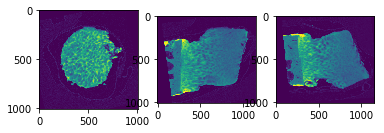

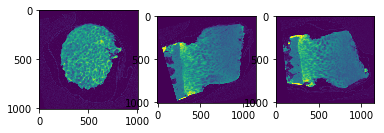

3. Crop and flip center volume:


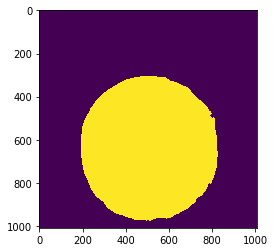

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


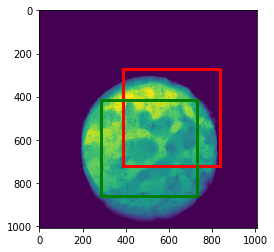

Center moment (green): x = 508, y = 638
Center of mass (red): x = 613.0, y = 495.0


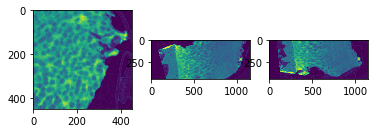

(448, 448, 1150)


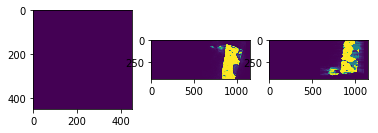

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

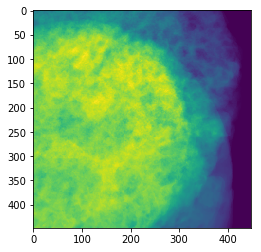

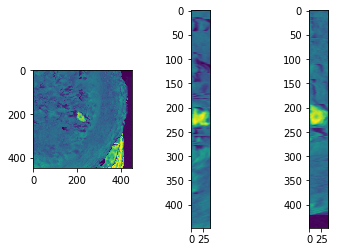

FloatProgress(value=0.0, description='Get interface:', max=448.0)

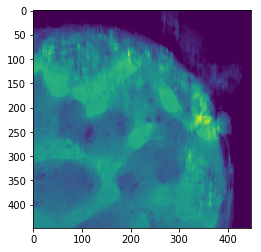

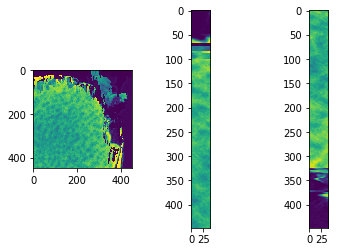

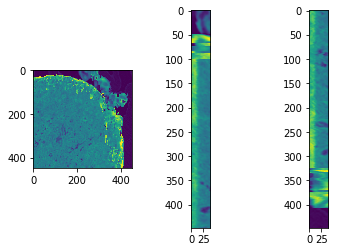

5. Save mean and std images


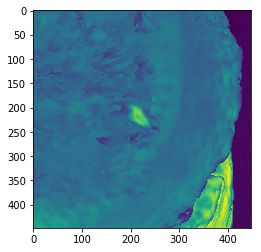

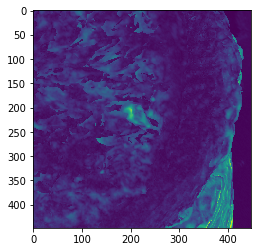

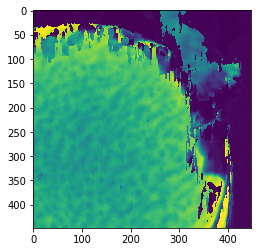

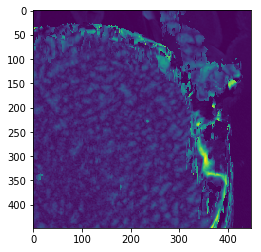

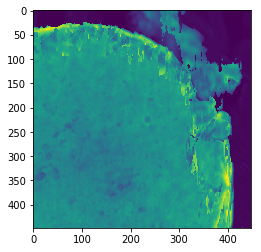

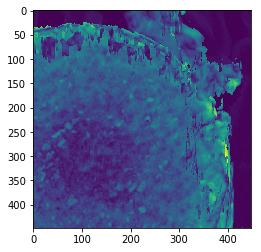

22_L3L_2_PTA_48h_Rec
Z:\3DHistoData\rekisteroidyt\22_L3L_2_PTA_48h_Rec\22_L3L_2_PTA_48h_Rec\Registration
Sample name: 22_L3L_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1167.0)

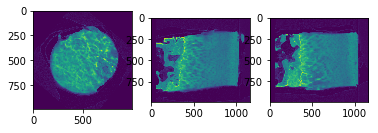

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

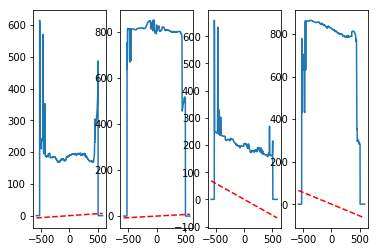

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


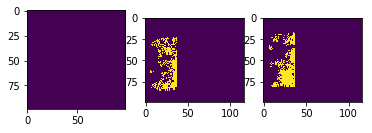

BBox angles: [ 0.7434876], [-6.49514771]
PCA angles: [[-7.62601651]], [[-11.27370997]]
Gradient descent angles: -2.0, -2.0
Gradient descent selected.


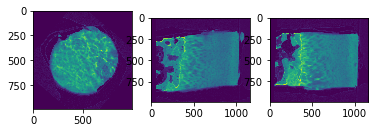

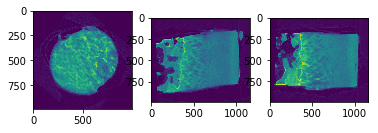

3. Crop and flip center volume:


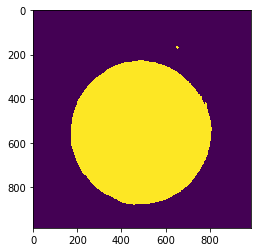

FloatProgress(value=0.0, description='Get center:', max=986.0)

Sum image along z-axis


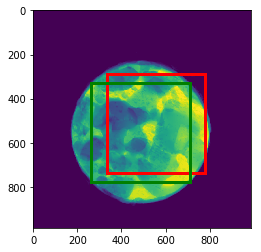

Center moment (green): x = 488, y = 553
Center of mass (red): x = 557.0, y = 513.0


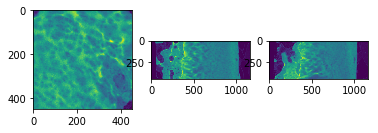

(448, 448, 1159)


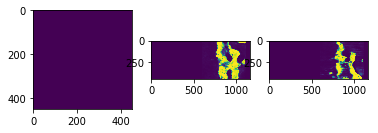

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

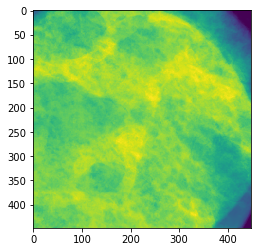

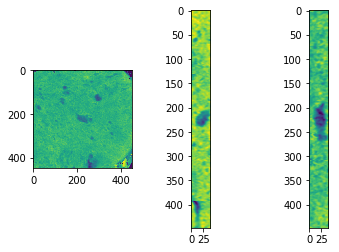

FloatProgress(value=0.0, description='Get interface:', max=448.0)

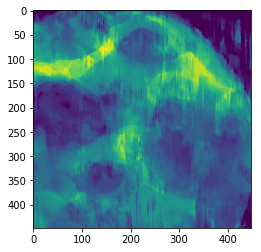

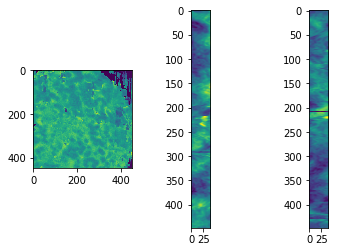

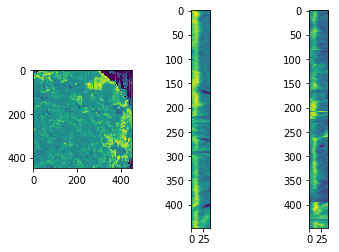

5. Save mean and std images


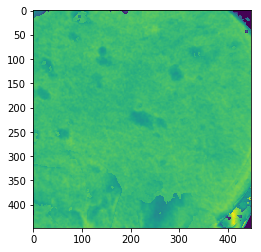

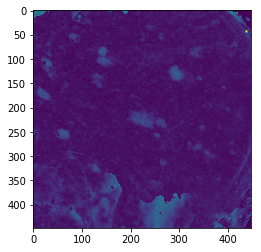

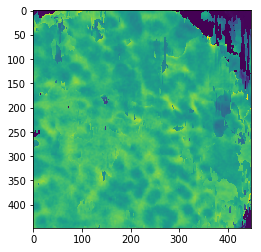

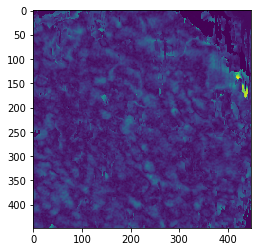

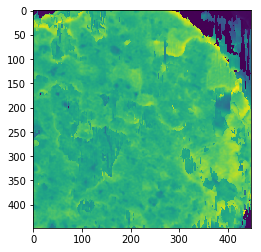

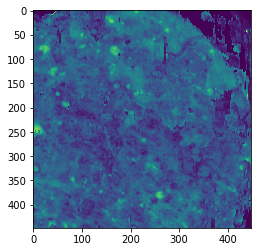

22_L6TL_2_PTA_48h_Rec
Z:\3DHistoData\rekisteroidyt\22_L6TL_2_PTA_48h_Rec\22_L6TL_2_PTA_48h_Rec\Registration
Sample name: 22_L6TL_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1308.0)

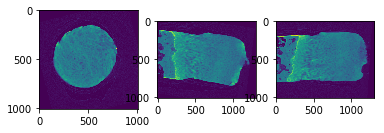

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

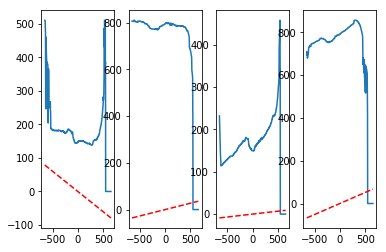

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


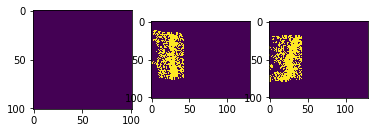

BBox angles: [-1.86999226], [ 3.33365917]
PCA angles: [[-3.83815394]], [[ 7.19688243]]
Gradient descent angles: 6.0, 0.0
Gradient descent selected.


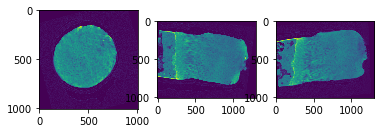

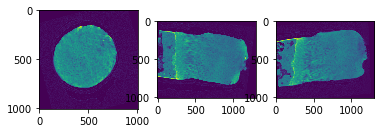

3. Crop and flip center volume:


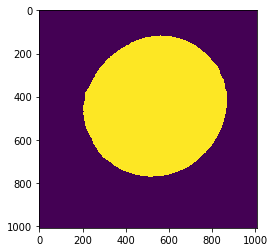

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


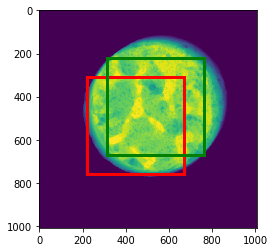

Center moment (green): x = 539, y = 444
Center of mass (red): x = 446.0, y = 534.0


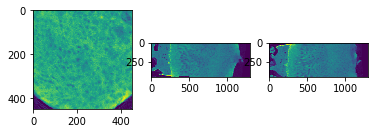

(448, 448, 1300)


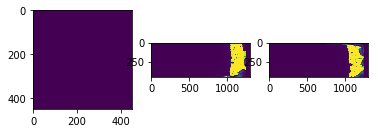

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

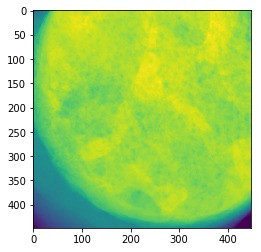

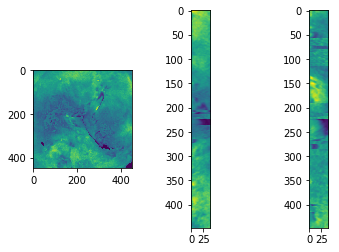

FloatProgress(value=0.0, description='Get interface:', max=448.0)

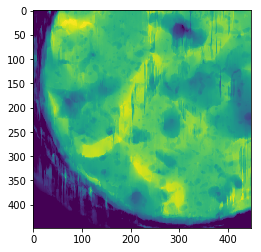

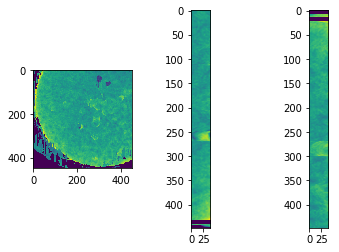

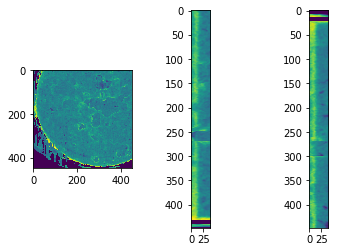

5. Save mean and std images


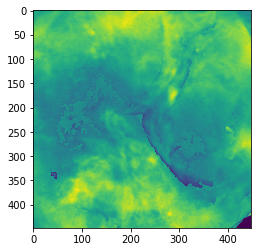

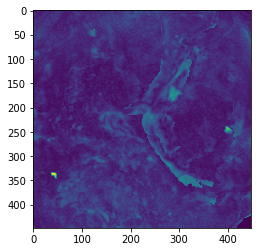

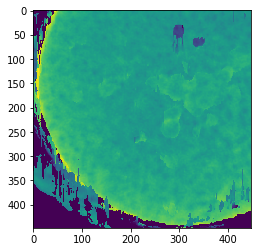

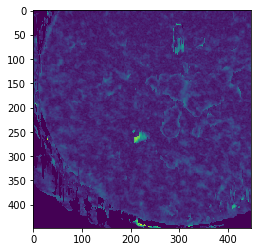

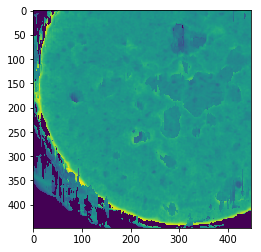

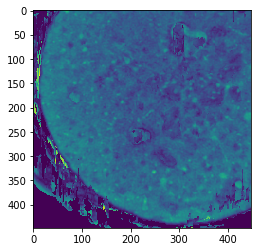

23_R3L_2_PTA_48h_Rec
Z:\3DHistoData\rekisteroidyt\23_R3L_2_PTA_48h_Rec\23_R3L_2_PTA_48h_Rec\Registration
Sample name: 23_R3L_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1268.0)

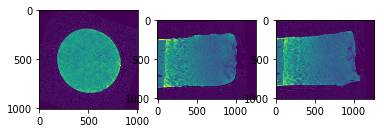

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

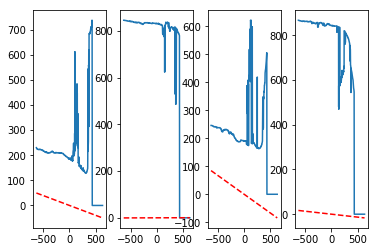

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


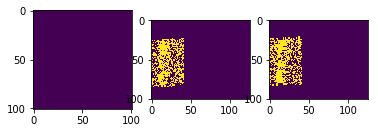

BBox angles: [-2.21553016], [-4.5498209]
PCA angles: [[ 3.00614369]], [[ 8.12825023]]
Gradient descent angles: 7.0, 7.0
Gradient descent selected.


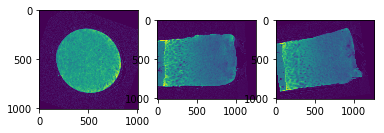

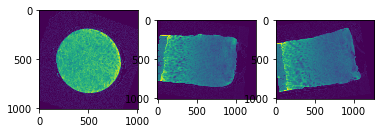

3. Crop and flip center volume:


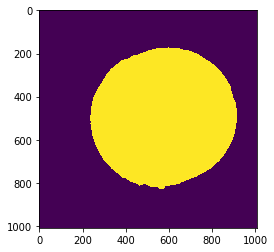

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


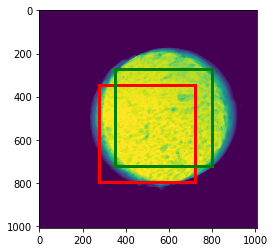

Center moment (green): x = 574, y = 495
Center of mass (red): x = 498.0, y = 569.0


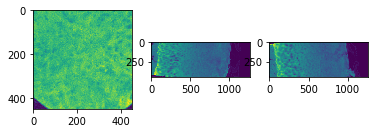

(448, 448, 1260)


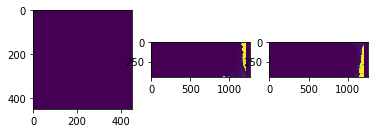

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

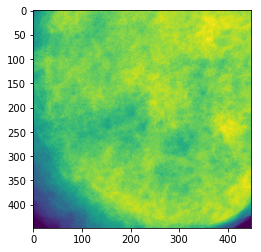

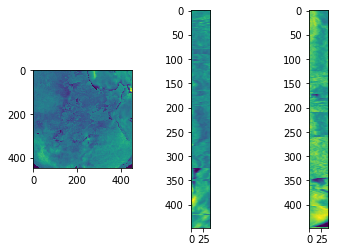

FloatProgress(value=0.0, description='Get interface:', max=448.0)

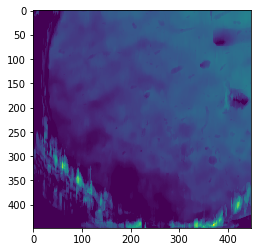

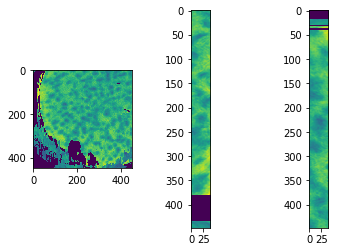

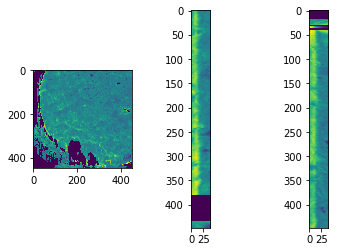

5. Save mean and std images


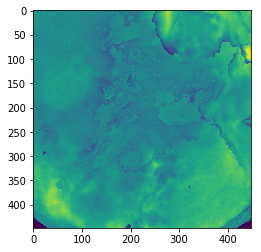

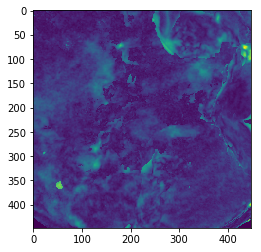

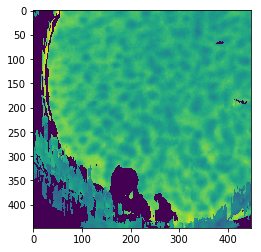

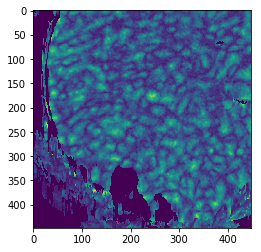

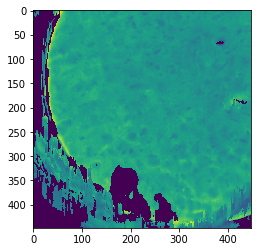

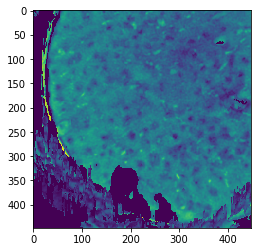

23_R6LT_2_PTA_48h_Rec
Z:\3DHistoData\rekisteroidyt\23_R6LT_2_PTA_48h_Rec\23_R6LT_2_PTA_48h_Rec\Registration
Sample name: 23_R6LT_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1319.0)

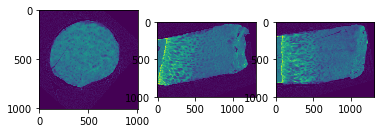

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

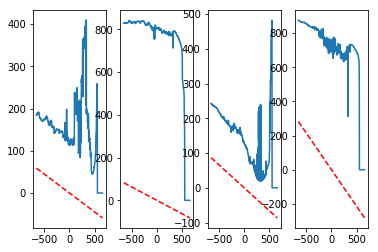

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


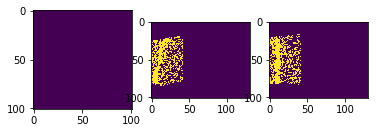

BBox angles: [-6.10494375], [-15.32647324]
PCA angles: [[ 4.68393228]], [[ 13.01635775]]
Gradient descent angles: -11.0, 7.0
Gradient descent selected.


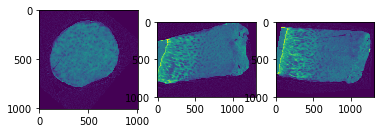

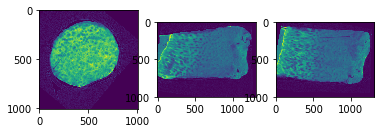

3. Crop and flip center volume:


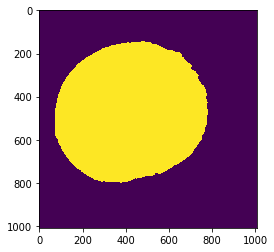

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


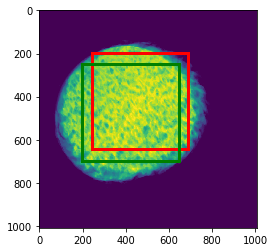

Center moment (green): x = 422, y = 472
Center of mass (red): x = 467.0, y = 420.0


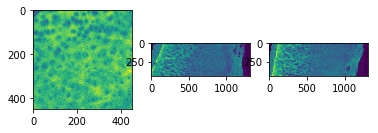

(448, 448, 1311)


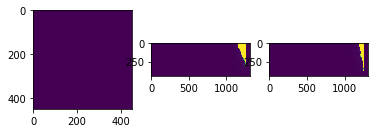

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

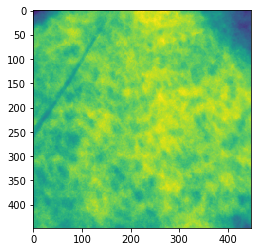

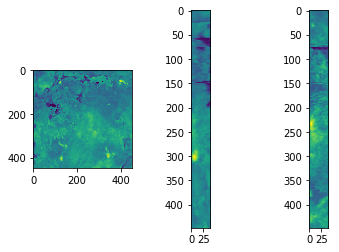

FloatProgress(value=0.0, description='Get interface:', max=448.0)

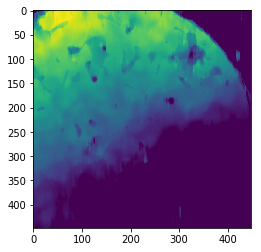

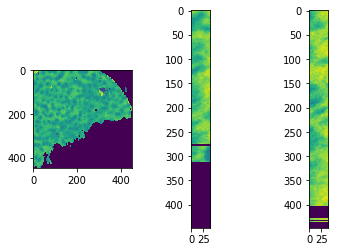

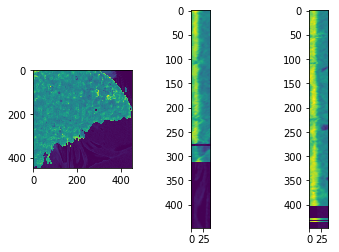

5. Save mean and std images


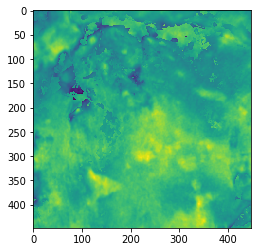

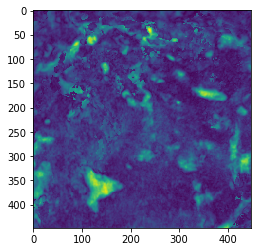

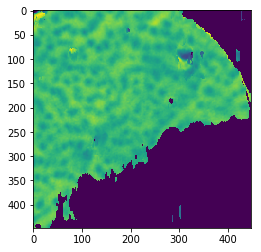

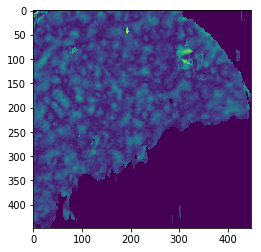

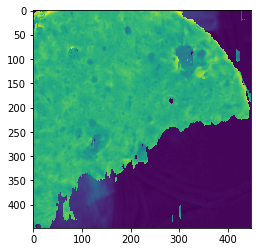

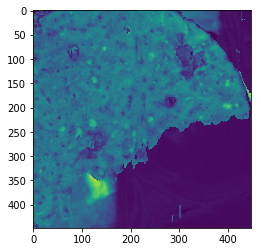

24_R3L_2_PTA_48h_Rec
Z:\3DHistoData\rekisteroidyt\24_R3L_2_PTA_48h_Rec\24_R3L_2_PTA_48h_Rec\Registration
Sample name: 24_R3L_2_PTA_48h_Rec
1. Load sample


FloatProgress(value=0.0, description='Loading:', max=1322.0)

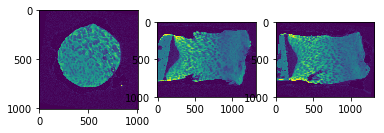

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

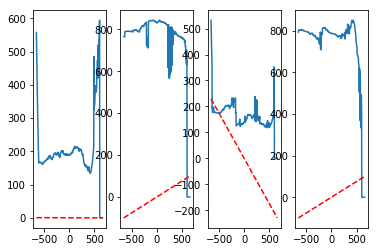

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


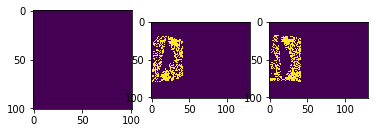

BBox angles: [ 4.28376007], [-5.28579473]
PCA angles: [[ 1.62152206]], [[ 3.57463165]]
Gradient descent angles: 7.0, 2.0
Gradient descent selected.


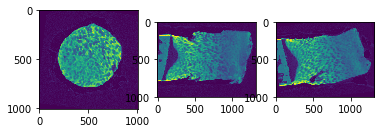

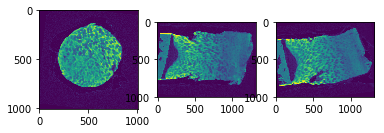

3. Crop and flip center volume:


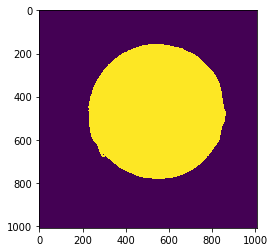

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


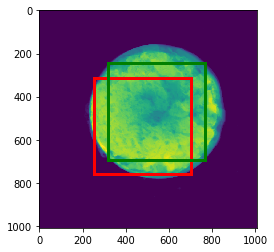

Center moment (green): x = 544, y = 469
Center of mass (red): x = 478.0, y = 536.0


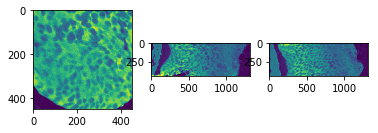

(448, 448, 1314)


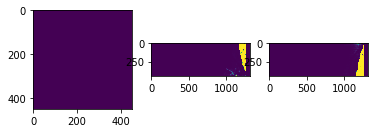

4. Get interface coordinates:


FloatProgress(value=0.0, description='Get interface:', max=448.0)

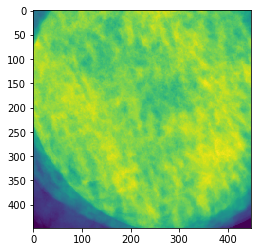

ValueError: could not broadcast input array from shape (35) into shape (40)

In [3]:
### Parameters
impath = r"Z:\3DHistoData\rekisteroidyt"
modelpath = r"Z:\Tuomas\UNetNew.model"
savepath = r"Z:\3DHistoData\SurfaceImages - revised"
sample = '15_L6TL_2'
threshold = 70
size = [448, 40, 10] # width, depth, offset

CalculateBatch(impath, savepath, size, threshold, False, modelpath)

### Individual sample pipeline

Sample list
-	name: 13_R3L_2_CA4+_Rec
0.0	name: 13_R3L_2_PTA_48h_Rec
-	name: 13_R6TL_2_CA4+_Rec
1.0	name: 13_R6TL_2_PTA_48h_Rec
-	name: 14_R3L_2_CA4+_Rec
2.0	name: 14_R3L_2_PTA_48h_Rec
-	name: 14_R6LT_2_CA4+_Rec
3.0	name: 14_R6LT_2_PTA_48h_Rec
-	name: 15_L3L_2_CA4+_Rec
4.0	name: 15_L3L_2_PTA_48h_Rec
-	name: 15_L6TL_2_CA4+_Rec
5.0	name: 15_L6TL_2_PTA_48h_Rec
-	name: 20_R2M_2_CA4+_Rec
6.0	name: 20_R2M_2_PTA_48h_Rec
-	name: 20_R6TM_2_CA4+_Rec
7.0	name: 20_R6TM_2_PTA_48h_Rec
-	name: 21_L3L_2_CA4+_Rec
8.0	name: 21_L3L_2_PTA_48h_Rec
-	name: 21_L6LT_1_CA4+_Rec
9.0	name: 21_L6LT_1_PTA_48h_Rec
-	name: 22_L3L_2_CA4+_Rec
10.0	name: 22_L3L_2_PTA_48h_Rec
-	name: 22_L6TL_2_CA4+_Rec
11.0	name: 22_L6TL_2_PTA_48h_Rec
-	name: 23_R3L_2_CA4+_Rec
12.0	name: 23_R3L_2_PTA_48h_Rec
-	name: 23_R6LT_2_CA4+_Rec
13.0	name: 23_R6LT_2_PTA_48h_Rec
-	name: 24_R3L_2_CA4+_Rec
14.0	name: 24_R3L_2_PTA_48h_Rec
-	name: 24_R6LT_2_CA4+_Rec
15.0	name: 24_R6LT_2_PTA_48h_Rec
-	name: 25_L3L_1_CA4+_Rec
16.0	name: 25_L3L_1_PTA_48h_

FloatProgress(value=0.0, description='Loading:', max=1264.0)

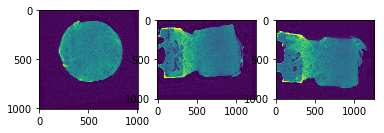

2. Orient sample


FloatProgress(value=0.0, description='Orienting:')

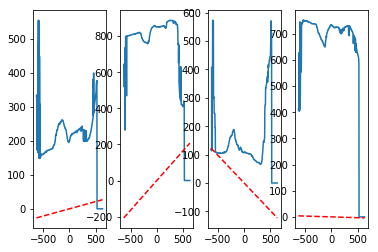

C:\Users\sarytky\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


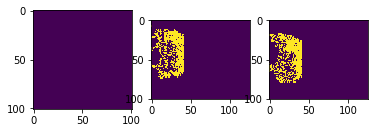

BBox angles: [ 10.29175949], [-5.67563581]
PCA angles: [[-6.87097577]], [[-0.57414512]]
Gradient descent angles: -3.0, -1.0
Gradient descent selected.


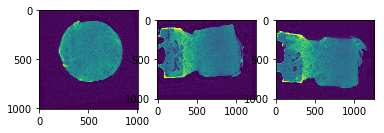

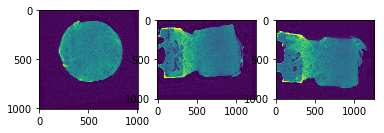

3. Crop and flip center volume:


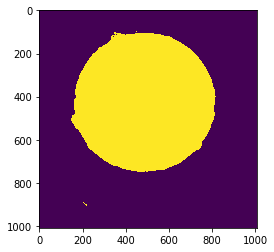

FloatProgress(value=0.0, description='Get center:', max=1008.0)

Sum image along z-axis


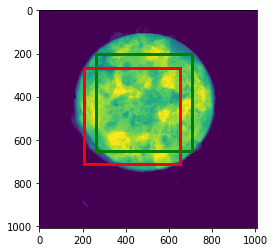

Center moment (green): x = 485, y = 426
Center of mass (red): x = 429.0, y = 490.0


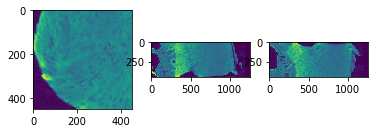

(448, 448, 1255)


In [ ]:
impath = r"Z:\3DHistoData\rekisteroidyt"
modelpath = r"Z:\Tuomas\UNetNew.model"
savepath = r"Z:\3DHistoData\SurfaceImages - revised"
sample = '15_L6TL_2'
threshold = 70
size = [448, 40, 10] # width, depth, offset
mask = False

CalculateIndividual(impath, savepath, size, threshold, False, modelpath)

### Binned dataset

In [ ]:
# Pipeline for binned sample and loaded mask
path = r"Z:\3DHistoData\Test data\21_L3L_binned"
path = r"Z:\3DHistoData\Test data\24_R6LT_2_binned"
mask = r"Z:\3DHistoData\Test data\21_L3L_binned\bonemask"
#path = r"Z:\3DHistoData\rekisteroidyt\24_R6LT_2_PTA_48h_Rec\24_R6LT_2_PTA_48h_Rec\Registration"
#mask = r"Z:\3DHistoData\rekisteroidyt\24_R6LT_2_CA4+_Rec\24_R6LT_2_CA4+_Rec\Suoristettu\Registration\bone_mask"
#path = r'Z:\3DHistoData\Test data\Cube2'
#mask = r'Z:\3DHistoData\Test data\Cube2'

savepath = r"Z:\3DHistoData\SurfaceImages"
modelpath = r"Z:\Tuomas\cntkunet.model"
sample = '15_L6TL_2'
threshold = 80
size = [100, 20, 5] # width, depth, offset
mask = True

Pipeline(path, files[k], savepath, threshold, size, mask)